In [1]:
import tensorflow

from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 18237665500691226245
, name: "/device:XLA_CPU:0"
device_type: "XLA_CPU"
memory_limit: 17179869184
locality {
}
incarnation: 11296234130117512793
physical_device_desc: "device: XLA_CPU device"
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 4959848384
locality {
  bus_id: 1
  links {
  }
}
incarnation: 15815539740599293192
physical_device_desc: "device: 0, name: NVIDIA GeForce GTX 1660 SUPER, pci bus id: 0000:07:00.0, compute capability: 7.5"
, name: "/device:XLA_GPU:0"
device_type: "XLA_GPU"
memory_limit: 17179869184
locality {
}
incarnation: 13814310311825569538
physical_device_desc: "device: XLA_GPU device"
]


In [32]:
from matplotlib import pyplot as plt
import numpy as np
import seaborn as sns
import pandas as pd
from PIL import Image

In [35]:
def plot_gan_samples(samples):
    fig, axes = plt.subplots(figsize=(10, 2), nrows=1, ncols=len(samples), sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples):
        ax.xaxis.set_visible(False)
        ax.yaxis.set_visible(False)
        im = ax.imshow(1 - img.reshape((2,2)), cmap='Greys_r')  
    return fig, axes

def plot_generator(samples, epoch):
    fig, axes = plt.subplots(figsize=(10, 2), nrows=1, ncols=len(samples), sharey=True, sharex=True)
    fig.suptitle(f'epoch: {epoch}', ha='left', fontweight='light')
    for ax, img in zip(axes.flatten(), samples):
        ax.xaxis.set_visible(False)
        ax.yaxis.set_visible(False)
        im = ax.imshow(1 - img.reshape((2,2)), cmap='Greys_r')  
        plt.close(fig)
    return fig, axes

def fig2img(fig):
    """Convert a Matplotlib figure to a PIL Image and return it"""
    import io
    buf = io.BytesIO()
    fig.savefig(buf)
    buf.seek(0)
    img = Image.open(buf)
    return img

def plot_log():
    x = np.linspace(0.001, 0.999, 100)
    E_r = lambda x: -np.log(x)
    plt.plot(x, E_r(x), label=r'$- \, log \, (x)$')
    E_f = lambda x: -np.log(1 - x)
    plt.plot(x, E_f(x), label=r'$- \, log \, (1 - x)$')
    plt.legend(fontsize='large')
    plt.xlabel('Prediction')
    plt.ylabel('Error')
    return True

def plot_errors(generator_errors, discriminator_errors):
    plt.figure(figsize=(16, 5))
    plt.subplot(1,2,1)  
    plt.plot(generator_errors)
    plt.title("Generator Error")
    plt.xlabel("Epoche")
    plt.ylabel("Error")
    plt.subplot(1,2,2)
    plt.plot(discriminator_errors)
    plt.title("Discriminator Error")
    plt.xlabel("Epoche")
    plt.ylabel("Error")
    plt.show()
    
def plot_discriminator_accuracy(accs_real, accs_fake):
    plt.figure(figsize=(16, 5))
    plt.subplot(1,2,1)  
    plt.plot(accs_real)
    plt.title("Real Data Accuracy")
    plt.xlabel("Epoche")
    plt.ylabel("Accuracy")
    plt.subplot(1,2,2)
    plt.plot(accs_fake)
    plt.title("Fake Data Accuracy")
    plt.xlabel("Epoche")
    plt.ylabel("Accuracy")
    plt.show()
    
def plot_1d_samples(generate_real_samples, generate_fake_samples, n=100):
    Xr, yr = generate_real_samples(n)
    dfr, dfr['real'] = pd.DataFrame(Xr, columns=['input', 'output']), yr
    Xf, yf = generate_fake_samples(n)
    dff, dff['real'] = pd.DataFrame(Xf, columns=['input', 'output']), yf
    df = pd.concat([dfr, dff], ignore_index=True)
    sns.scatterplot(data=df, x='input', y='output', hue='real')
    
def plot_1d_performance(epoch, x_real, x_fake, accuracy_real, accuracy_fake):
    fig = plt.figure(figsize=(19, 5))
    plt.subplot(1,3,1)
    plt.xlim(-1.25, 1.25)
    plt.ylim(-0.25, 0.75)
    plt.title(f'Epoch: {epoch:0>5d}')
    plt.scatter(x_real[:, 0], x_real[:, 1], color='red', alpha=0.3)
    plt.scatter(x_fake[:, 0], x_fake[:, 1], color='blue', alpha=0.3)
    plt.subplot(1,3,2)
    plt.title(f'Accuracy Real: {accuracy_real[-1]:.3f}')
    plt.plot(accuracy_real)
    plt.subplot(1,3,3)
    plt.title(f'Accuracy Fake: {accuracy_fake[-1]:.3f}')
    plt.plot(accuracy_fake)
    plt.close(fig)
    return fig

In [2]:
pip list

Package                       Version
----------------------------- ---------
absl-py                       1.4.0
aiofiles                      22.1.0
aiosqlite                     0.18.0
alabaster                     0.7.12
anyio                         3.5.0
appdirs                       1.4.4
argon2-cffi                   21.3.0
argon2-cffi-bindings          21.2.0
arrow                         1.2.3
astroid                       2.14.2
asttokens                     2.0.5
astunparse                    1.6.3
atomicwrites                  1.4.0
attrs                         22.1.0
autopep8                      1.6.0
Babel                         2.11.0
backcall                      0.2.0
bcrypt                        3.2.0
beautifulsoup4                4.12.2
binaryornot                   0.4.4
black                         0.0
bleach                        4.1.0
Bottleneck                    1.3.5
brotlipy                      0.7.0
cachetools                    5.3.1
certifi        

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import trange
import numpy as np

In [3]:
import pandas as pd

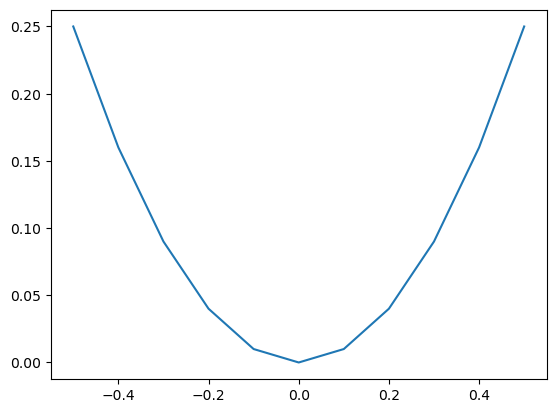

In [6]:
inputs = np.linspace(-0.5, 0.5, 11)
outputs = [(lambda x: x*x)(x) for x in inputs]

plt.plot(inputs, outputs);

In [38]:
# generate n real samples with class labels '1'
def generate_real_samples(n):
    X1 = np.random.rand(n) - 0.5       # generate inputs in [-0.5, 0.5]
    X2 = X1 * X1                       # generate outputs X^2
    X1 = X1.reshape(n, 1)
    X2 = X2.reshape(n, 1)
    X = np.hstack((X1, X2))
    y = np.ones((n, 1))                # generate class labels 'real'
    return X, y

# generate n fake samples with class labels '0'
def generate_fake_samples(n):
    X1 = -1 + np.random.rand(n) * 2    # generate inputs in [-1, 1]
    X2 = -1 + np.random.rand(n) * 2    # generate outputs in [-1, 1]
    X1 = X1.reshape(n, 1)
    X2 = X2.reshape(n, 1)
    X = np.hstack((X1, X2))
    y = np.zeros((n, 1))               # generate class labels 'fake'
    return X, y

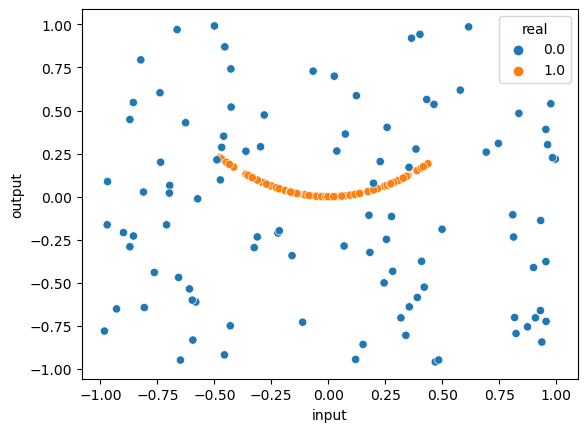

In [39]:
plot_1d_samples(generate_real_samples, generate_fake_samples)

In [21]:
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

In [22]:
# define the standalone discriminator model
def define_discriminator(n_inputs=2):
    model = Sequential()
    model.add(Dense(25, activation='relu', kernel_initializer='he_uniform', input_dim=n_inputs))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model

discriminator = define_discriminator()
discriminator.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 25)                75        
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 26        
Total params: 101
Trainable params: 101
Non-trainable params: 0
_________________________________________________________________


In [23]:
accs_real = []
accs_fake = []

def train_discriminator(model, n_epochs=1000, n_batch=128):
    half_batch = int(n_batch / 2)
    for epoch in trange(n_epochs):
        
        # train ond update weights of real data
        X_real, y_real = generate_real_samples(half_batch)
        model.train_on_batch(X_real, y_real)
        
        # train ond update weights of fake data
        X_fake, y_fake = generate_fake_samples(half_batch)
        model.train_on_batch(X_fake, y_fake)

        _, acc_real = model.evaluate(X_real, y_real, verbose=0)
        _, acc_fake = model.evaluate(X_fake, y_fake, verbose=0)
        accs_real.append(acc_real)
        accs_fake.append(acc_fake)

# train the model for 1.000 batches and using 128 samples per batch (64 fake and 64 real)
#train_discriminator(discriminator, n_epochs=100)

In [41]:
def generate_latent_points(latent_dim, n):
    x_input = np.random.randn(latent_dim * n)
    x_input = x_input.reshape(n, latent_dim)       # reshape into a batch of inputs for the network
    return x_input                                 # as input for the generator

def generate_fake_samples(generator, latent_dim, n):
    x_input = generate_latent_points(latent_dim, n)
    X = generator.predict(x_input)                 # predict outputs
    y = np.zeros((n, 1))                           # create class labels
    return X, y

In [42]:
def define_generator(latent_dim, n_outputs=2):
    model = Sequential()
    model.add(Dense(25, activation='relu', kernel_initializer='he_uniform', input_dim=latent_dim))
    model.add(Dense(n_outputs, activation='linear'))
    return model

# define the generator model with a latent space of five dimensions
latent_dim = 5

generator = define_generator(latent_dim)
generator.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 25)                150       
_________________________________________________________________
dense_5 (Dense)              (None, 2)                 52        
Total params: 202
Trainable params: 202
Non-trainable params: 0
_________________________________________________________________


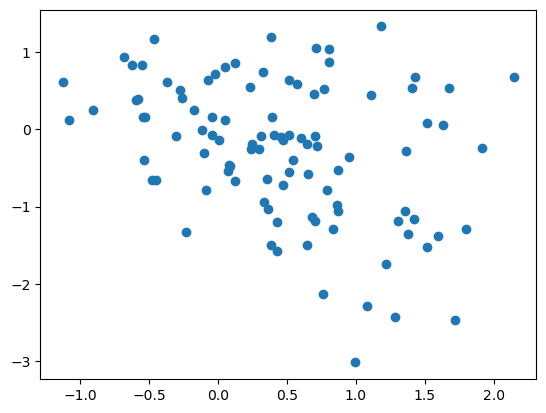

In [43]:
# plot fake samples
X, _ = generate_fake_samples(generator, latent_dim, 100)
plt.scatter(X[:, 0], X[:, 1]);

In [44]:
# define the combined generator and discriminator model, for updating the generator
def define_gan(generator, discriminator):
    discriminator.trainable = False   # make weights in the discriminator not trainable
    model = Sequential()              # connect them
    model.add(generator)              # add generator
    model.add(discriminator)          # add the discriminator
    model.compile(loss='binary_crossentropy', optimizer='adam')   # compile model
    return model
 
# create the gan
gan = define_gan(generator, discriminator)
gan.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential_3 (Sequential)    (None, 2)                 202       
_________________________________________________________________
sequential (Sequential)      (None, 1)                 101       
Total params: 303
Trainable params: 202
Non-trainable params: 101
_________________________________________________________________


In [45]:
def summarize_performance(epoch, generator, discriminator, latent_dim, n=100):
    x_real, y_real = generate_real_samples(n)                            # prepare real samples
    _, acc_real = discriminator.evaluate(x_real, y_real, verbose=0)      # evaluate discriminator on real examples
    x_fake, y_fake = generate_fake_samples(generator, latent_dim, n)     # prepare fake examples
    _, acc_fake = discriminator.evaluate(x_fake, y_fake, verbose=0)      # evaluate discriminator on fake examples
    return mlplot.plot_1d_performance(epoch, acc_real, acc_fake, x_real, x_fake)

In [46]:
import mlplot

In [49]:
# train

n_epochs=10000
n_batch=128
half_batch = int(n_batch / 2)

# collect data for plot
images = []
accuracy_real = []
accuracy_fake = []

for epoch in trange(n_epochs):
    x_real, y_real = generate_real_samples(half_batch)                          # prepare real samples
    x_fake, y_fake = generate_fake_samples(generator, latent_dim, half_batch)   # prepare fake examples
        
    # update discriminator
    discriminator.train_on_batch(x_real, y_real)
    discriminator.train_on_batch(x_fake, y_fake)

    x_gan = generate_latent_points(latent_dim, n_batch)                         # points in latent space as input for the generator
    y_gan = np.ones((n_batch, 1))                                               # inverted labels for the fake samples
        
    # update generator via the discriminators error
    gan.train_on_batch(x_gan, y_gan)

    # evaluate the model every 50 epochs
    if epoch % 50 == 0:
        #x_real, y_real = generate_real_samples(100)                            # prepare real samples
        _, acc_real = discriminator.evaluate(x_real, y_real, verbose=0)        # evaluate discriminator on real examples
        #x_fake, y_fake = generate_fake_samples(generator, latent_dim, 100)     # prepare fake examples
        _, acc_fake = discriminator.evaluate(x_fake, y_fake, verbose=0)        # evaluate discriminator on fake examples
        accuracy_real.append(acc_real)
        accuracy_fake.append(acc_fake)
        fig = plot_1d_performance(epoch, x_real, x_fake, accuracy_real, accuracy_fake)
        image = fig2img(fig)
        images.append(image)

  0%|          | 0/10000 [00:00<?, ?it/s]

In [52]:
import os

if not os.path.exists('images'):
    os.makedirs('images')

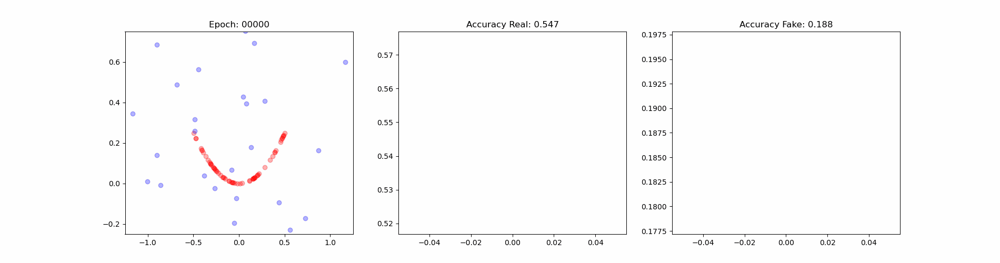

In [54]:
from IPython.display import Image

images[0].save('images/simple_1d_gan.gif', save_all=True, append_images=images[1:], optimize=False, duration=80, loop=0)
Image(filename='images/simple_1d_gan.gif')